In [58]:
import matplotlib as plt
import seaborn as sns
import numpy as np
import pandas as pd
%matplotlib inline

In [59]:
df = pd.read_csv('life_expectancy.csv')
df = df.dropna()
df

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [60]:
# pplot = sns.pairplot(df)

In [61]:
df.columns
new = {}
for col in df.columns:
    new[col] = col.strip()
df.rename(columns=new, inplace=True)
df.columns
#clean data

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

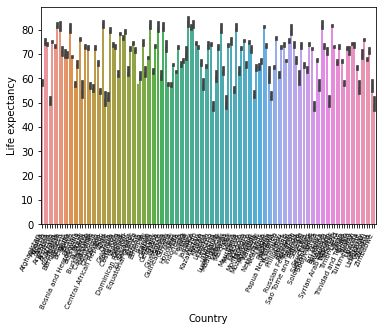

In [62]:
chart = sns.barplot(x='Country', y='Life expectancy', data=df)
chart.set_xticklabels(
    chart.get_xticklabels(), 
    rotation=65,
    horizontalalignment='right',
    fontsize='x-small')

plt.rcParams['figure.dpi'] = 800
plt.rcParams['savefig.dpi'] = 600
None

<AxesSubplot:xlabel='Year', ylabel='Life expectancy'>

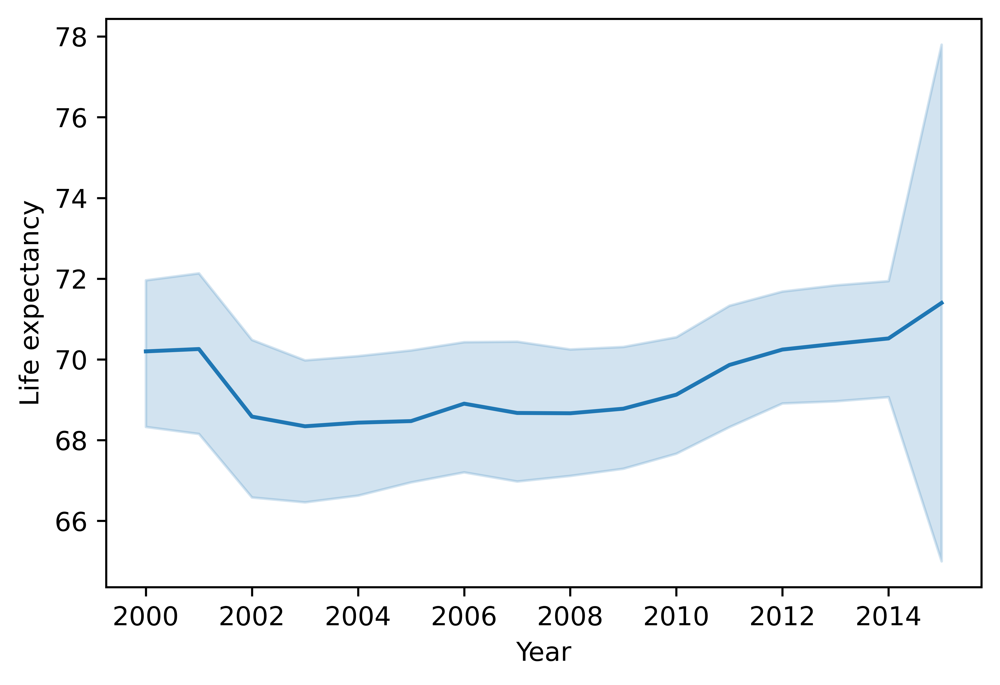

In [63]:
sns.lineplot(x='Year', y='Life expectancy', data=df)

<AxesSubplot:xlabel='Life expectancy', ylabel='Income composition of resources'>

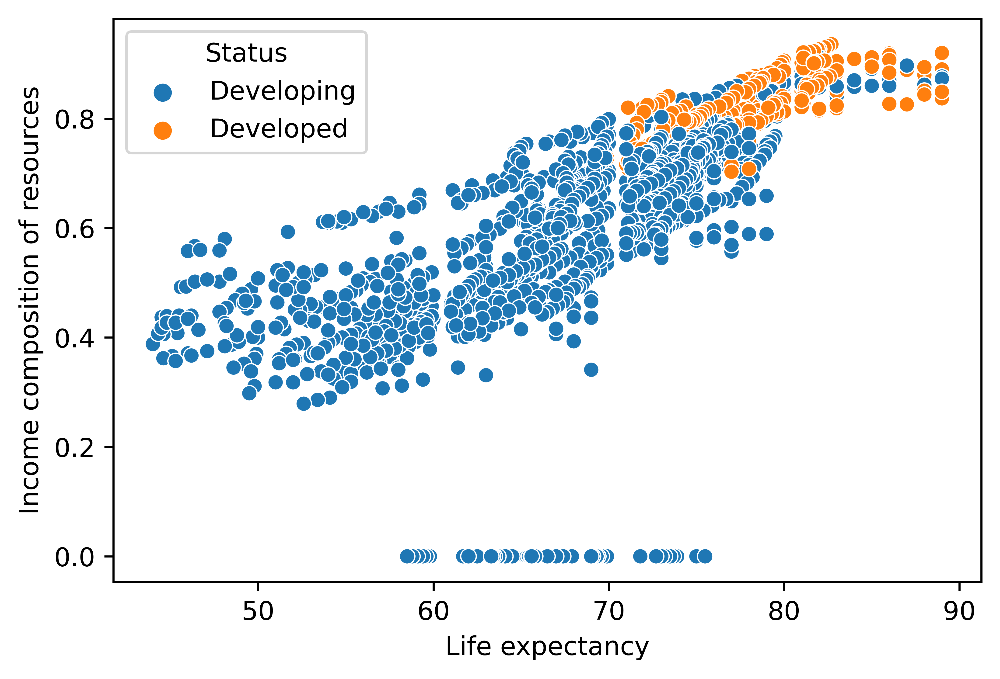

In [64]:
#Countries that are more developed seem to have higher life expectancy
sns.scatterplot(x='Life expectancy', y='Income composition of resources', hue='Status', data=df)

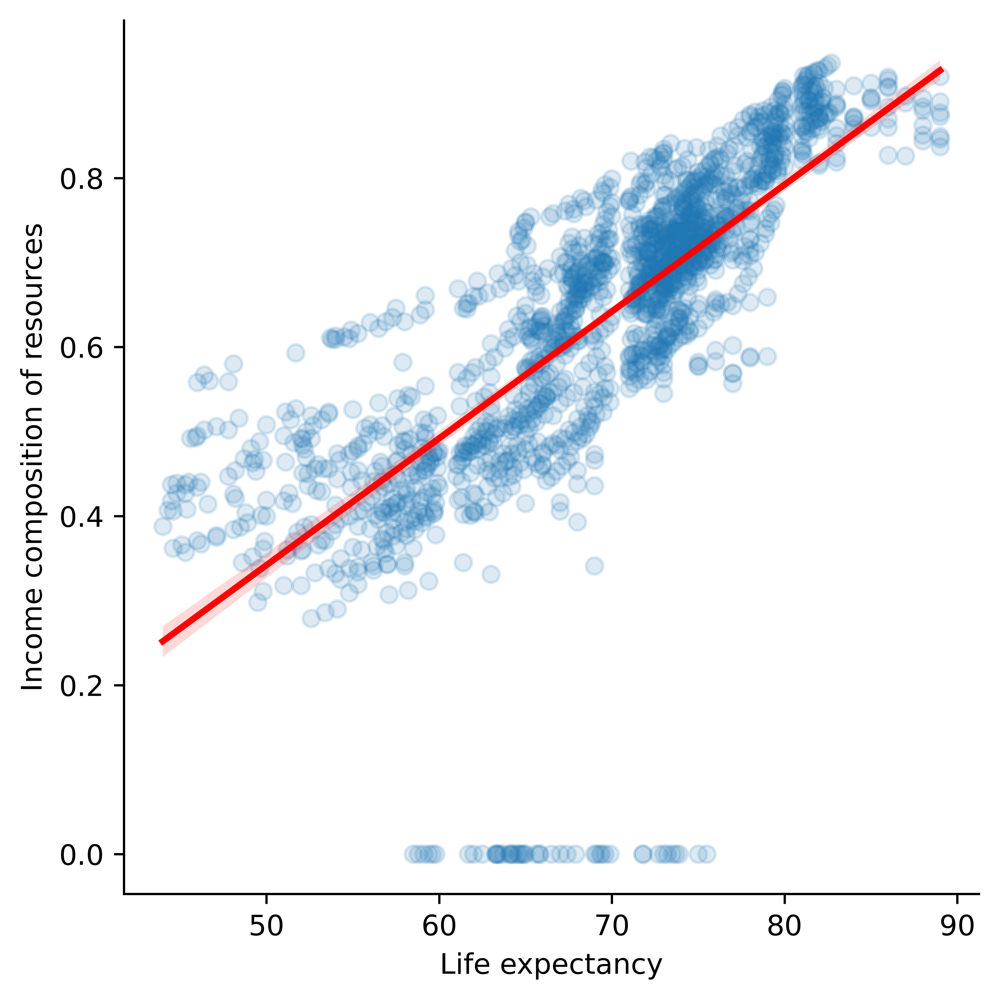

In [65]:
#Countries with more resources have longer life expectancy
sns.lmplot(x='Life expectancy', y='Income composition of resources', scatter_kws={'alpha': 0.15}, line_kws={'color': 'red'}, data=df)

<AxesSubplot:xlabel='Life expectancy', ylabel='Schooling'>

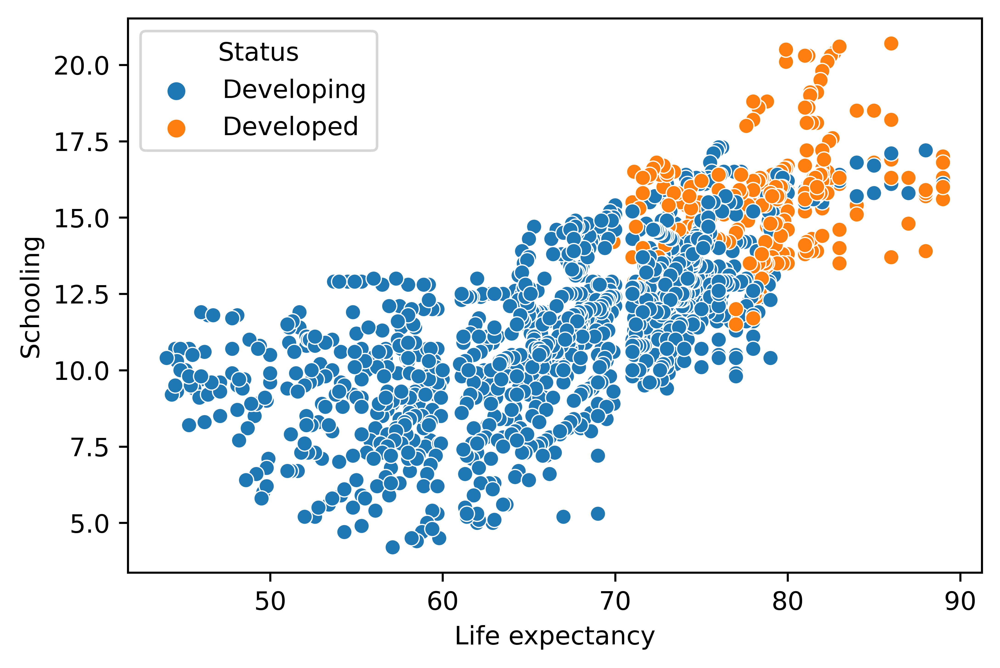

In [66]:
#Countries with more schooling
sns.scatterplot(x='Life expectancy', y='Schooling', hue='Status', data=df)

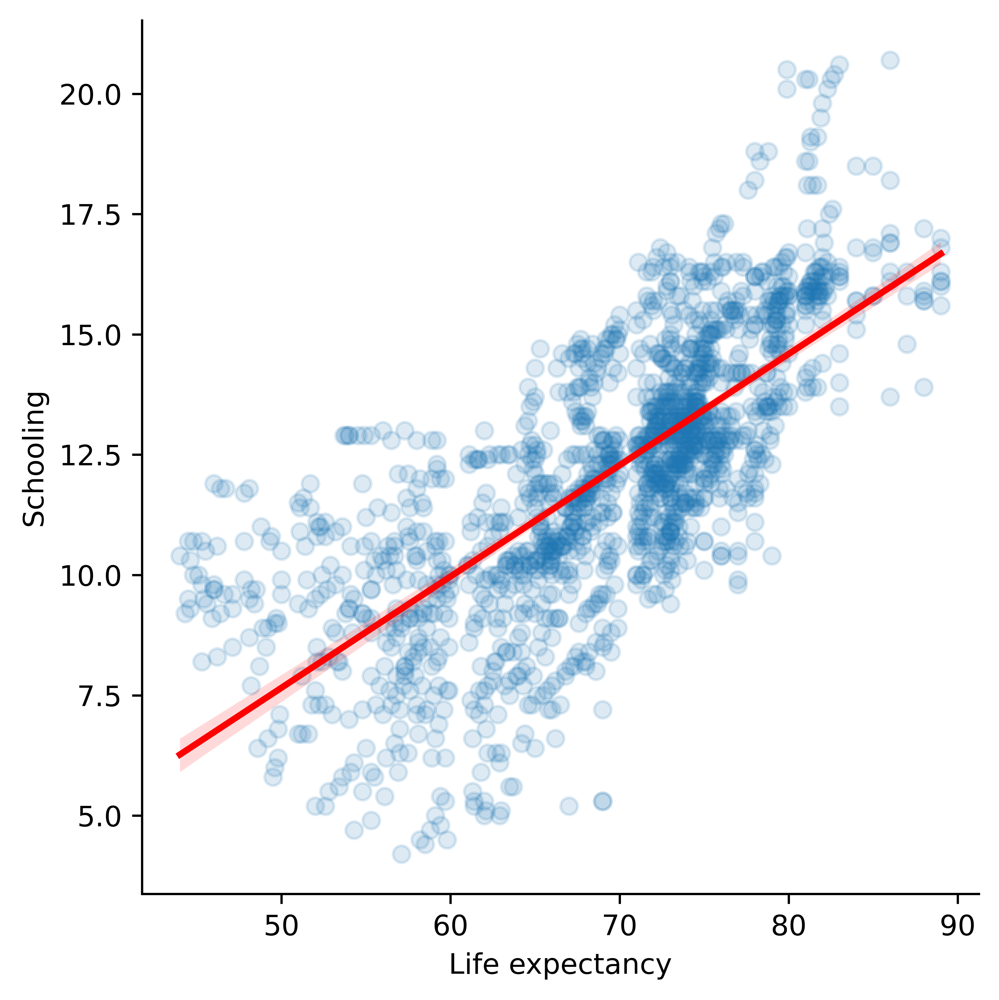

In [67]:
sns.lmplot(x='Life expectancy', y='Schooling', scatter_kws={'alpha': 0.15}, line_kws={'color': 'red'}, data=df)

<AxesSubplot:xlabel='Status', ylabel='Life expectancy'>

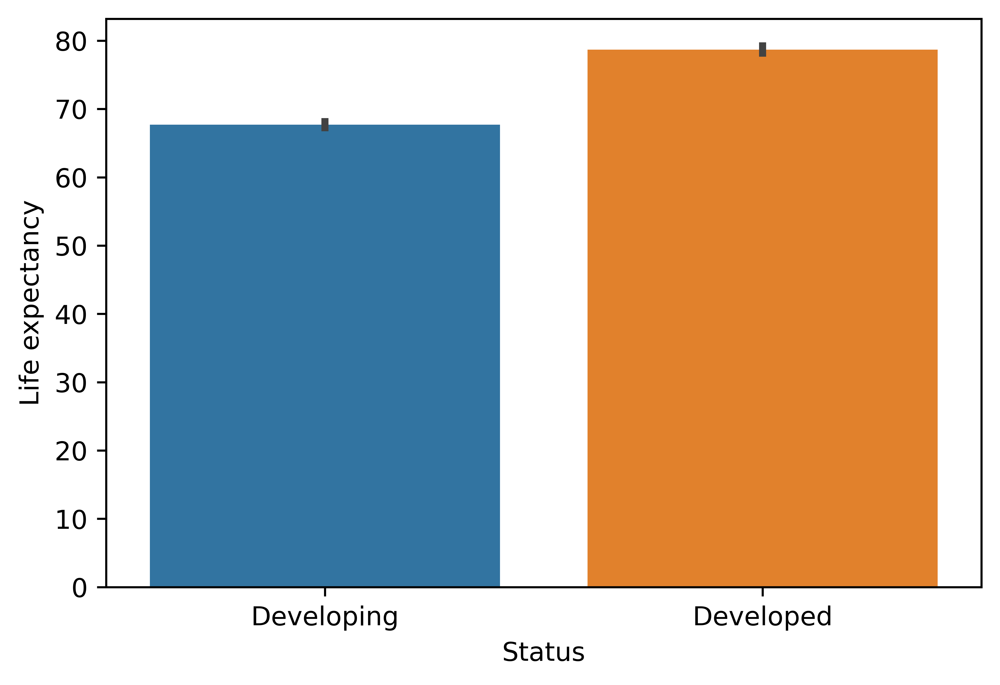

In [68]:
sns.barplot(x='Status', y='Life expectancy', data=df)

In [69]:
df.Schooling

0       10.1
1       10.0
2        9.9
3        9.8
4        9.5
        ... 
2933     9.2
2934     9.5
2935    10.0
2936     9.8
2937     9.8
Name: Schooling, Length: 1649, dtype: float64

What the data looks like without the outliers

In [70]:
incomedf = df[df['Income composition of resources'] != 0]

In [71]:
schoolingdf = df[df['Schooling'] != 0]

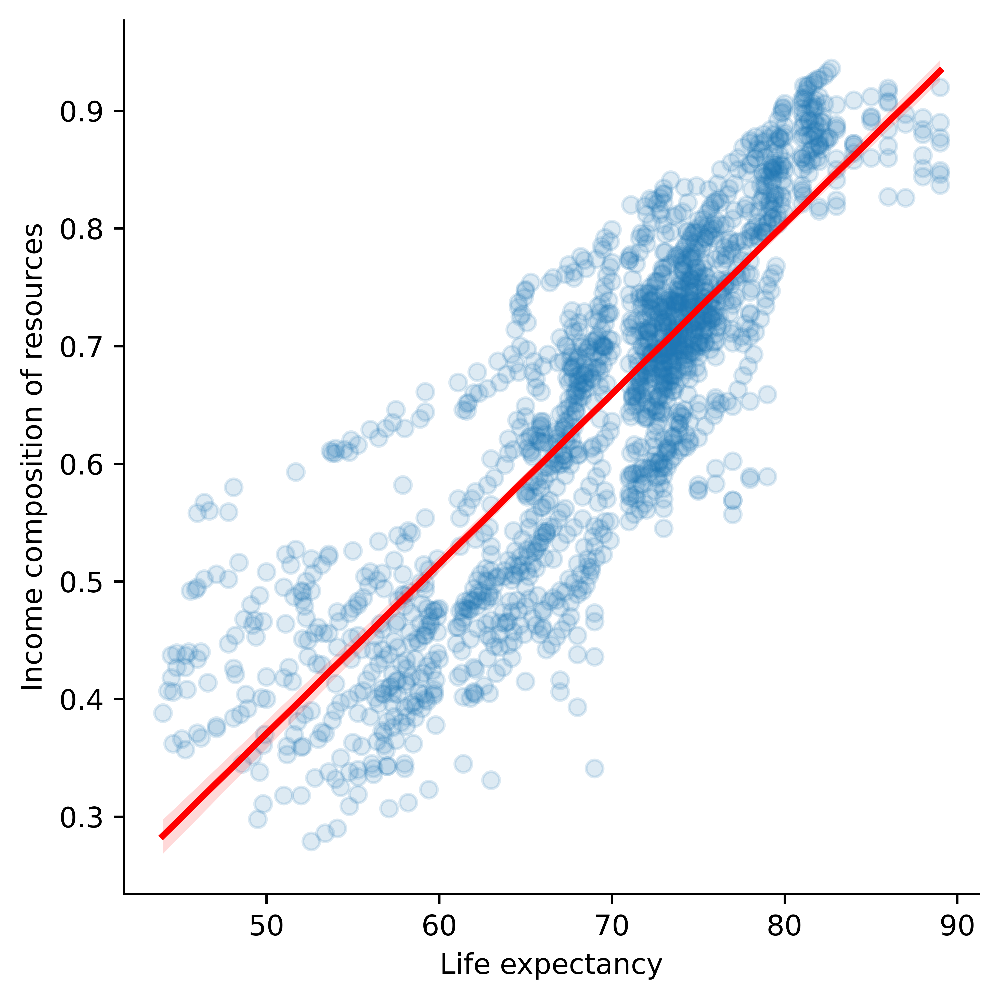

In [72]:
sns.lmplot(x='Life expectancy', y='Income composition of resources', scatter_kws={'alpha': 0.15}, line_kws={'color': 'red'}, data=incomedf)

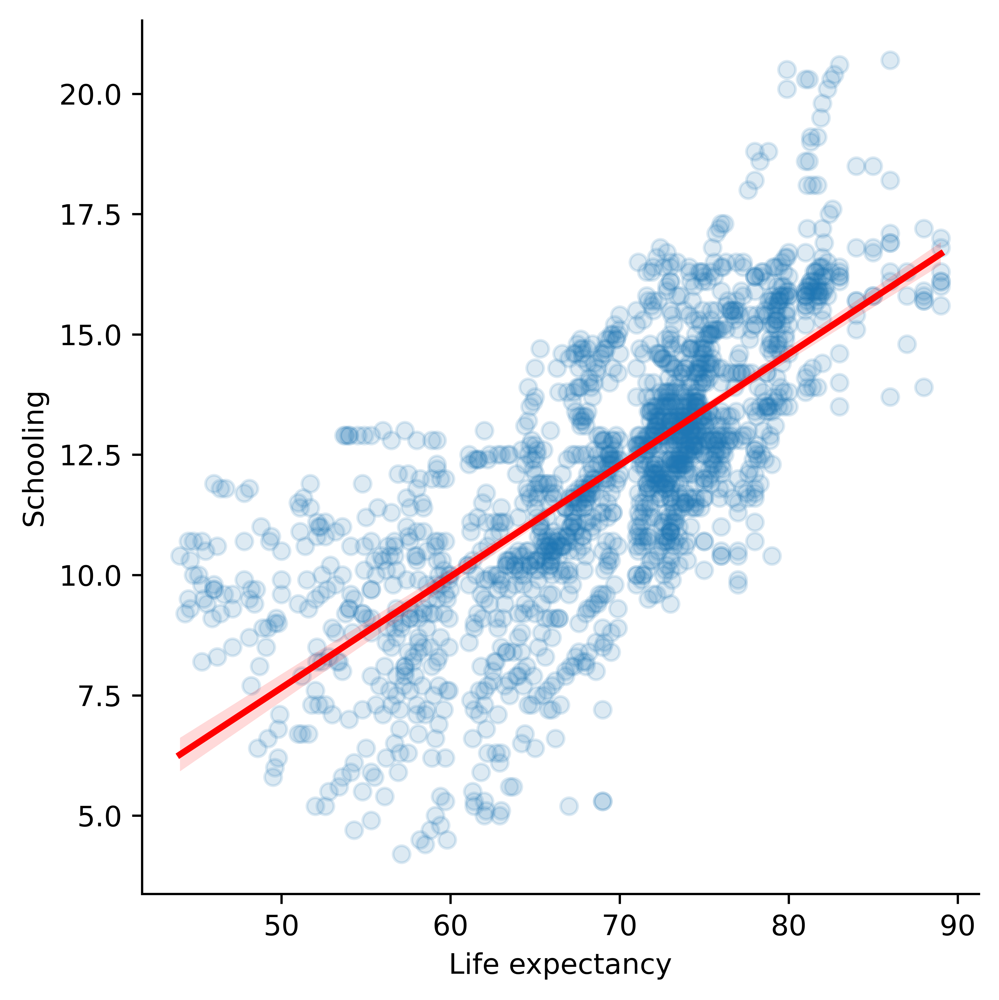

In [73]:
sns.lmplot(x='Life expectancy', y='Schooling', scatter_kws={'alpha': 0.15}, line_kws={'color': 'red'}, data=schoolingdf)

In [74]:
X = df[['Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling']]
Y = df['Life expectancy']

Splitting the data into train and testing.

In [75]:
from sklearn.model_selection import train_test_split

In [76]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=.5, random_state=42)

In [77]:
from sklearn.linear_model import LinearRegression

In [78]:
model = LinearRegression()

In [79]:
model.fit(X_train, Y_train)

LinearRegression()

In [80]:
model.coef_

array([-1.66822219e-02,  7.74574579e-02, -8.76442995e-02,  4.40023262e-04,
       -4.47157700e-03, -1.08338683e-05,  2.75844168e-02, -5.84587783e-02,
        2.61063505e-03,  1.14217357e-01,  1.94893026e-02, -4.16678807e-01,
       -4.72724791e-06,  1.54684749e-09, -5.22783971e-02, -5.43146833e-03,
        7.71894781e+00,  1.05596900e+00])

In [81]:
prediction = model.predict(X_test)

In [82]:
m, b = np.polyfit(Y_test, prediction, 1)

Text(0.5, 0, 'Life expectancy')

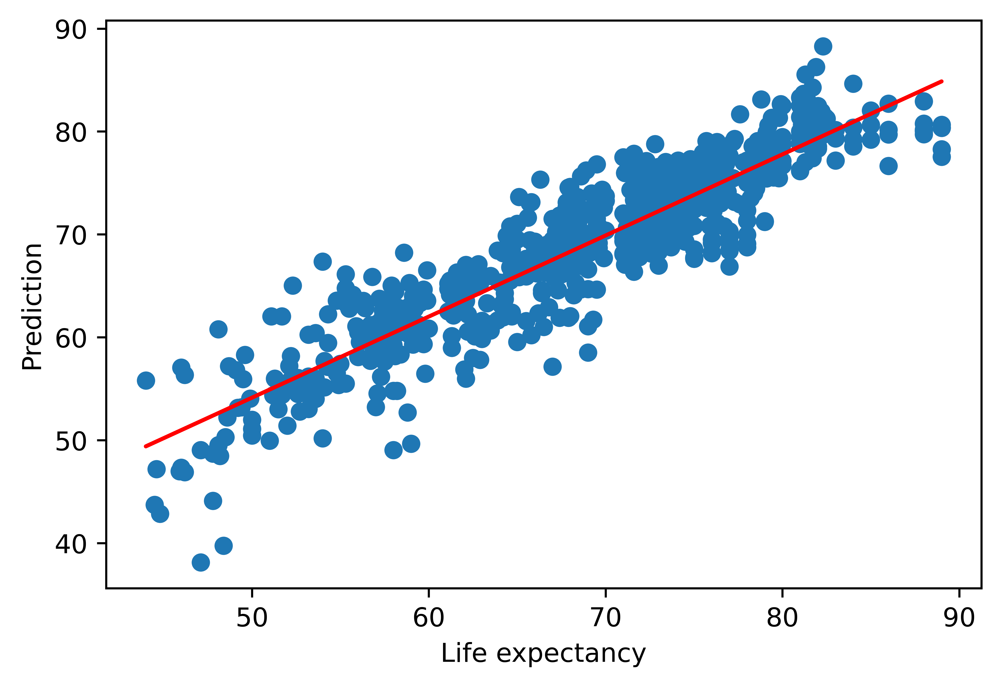

In [83]:
plt.pyplot.scatter(Y_test, prediction)
plt.pyplot.plot(Y_test, m*Y_test+b, color='red')
plt.pyplot.ylabel('Prediction')
plt.pyplot.xlabel('Life expectancy')

The amount of error is a bit high

In [85]:
import sklearn.metrics as metrics
print('MAE:', (metrics.mean_absolute_error(Y_test, prediction)))
print('MSE:', (metrics.mean_squared_error(Y_test, prediction)))
print('RMSE:', (np.sqrt(metrics.mean_squared_error(Y_test, prediction))))


MAE: 2.8404841788252986
MSE: 13.464840683860784
RMSE: 3.669446917978346


/Users/joshuamin/miniconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Life expectancy', ylabel='Density'>

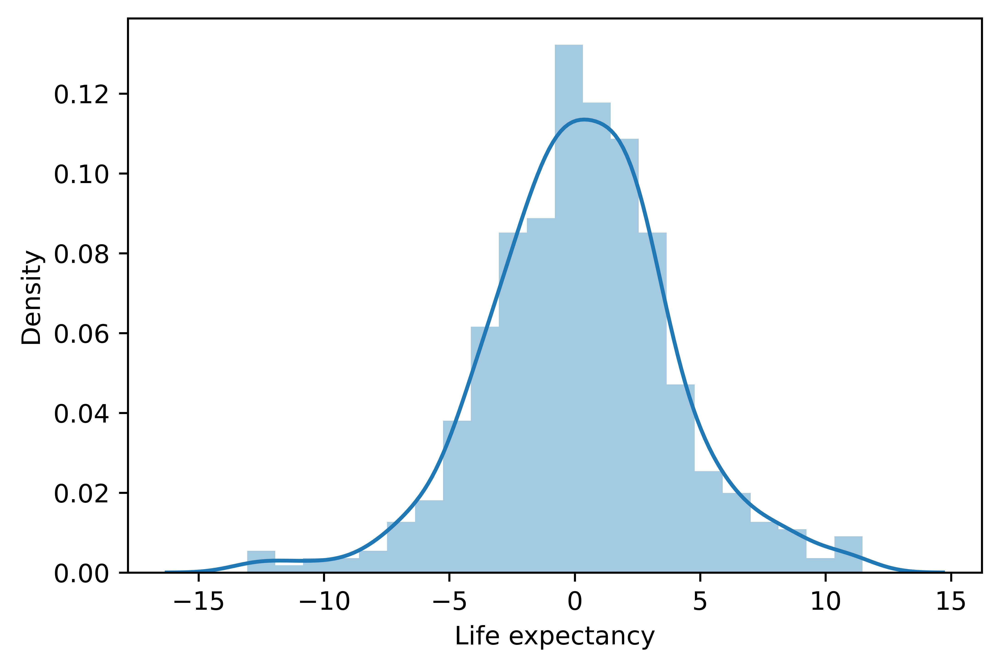

In [50]:
sns.distplot((Y_test-prediction))

In [51]:
pd.DataFrame(prediction, Y_test)

,0
Life expectancy,
67.5,71.699016
73.8,72.906780
79.1,80.081499
54.9,55.054786
48.6,52.251610
...,...
64.8,69.403380
71.4,71.136396
77.2,75.420251


In [52]:
pd.DataFrame(model.coef_ , X.columns, columns=['Coeffecient'])

,Coeffecient
Adult Mortality,-1.635641e-02
infant deaths,9.346263e-02
Alcohol,-9.880041e-02
percentage expenditure,4.860852e-04
Hepatitis B,-7.376963e-03
Measles,-8.250258e-06
BMI,2.491546e-02
under-five deaths,-7.030864e-02
Polio,6.461828e-03
Total expenditure,9.673598e-02


We can tell from the coeffecients, the income composition of resources and schooling have the most positive impact on life expectancy.

This means that if countries want their people to live a longer expected life, they should increase their income composition of resources. I would recommend that countries keep their income on the 0 to 1 scale at around a .65 if they want their people to have a life expectancy of at least 70. I also recommend to encourage schooling and support it in the culture of their country.

In [86]:
from sklearn import model_selection
xval = model_selection.KFold(10, shuffle=True)

# Train and test model
model = LinearRegression()
features = ['Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling']
y = df['Life expectancy']
X = df[features]
results = model_selection.cross_validate(model, X, y, scoring='r2', cv=xval, return_train_score=True)

# Calculate mean R^2 for training and testing data
train_r2 = results['train_score'].mean()
train_r2_sd = results['train_score'].std()
test_r2 = results['test_score'].mean()
test_r2_sd = results['test_score'].std()

0.8299090225355543